In [24]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os

In [25]:
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
import random
from PIL import Image
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras import Sequential, Model
from keras.layers import (Conv2D, MaxPooling2D, Dense, Flatten, \
                          Dropout, Input,GlobalAveragePooling2D,BatchNormalization)
from tensorflow.keras.activations import softmax
from tensorflow.keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from mpl_toolkits.axes_grid1 import ImageGrid
from keras.models import Model
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.metrics import (ConfusionMatrixDisplay, confusion_matrix, \
                             accuracy_score)
import cv2

In [26]:
our_folders = ['Acne and Rosacea Photos', \
              'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions', \
              'Melanoma Skin Cancer Nevi and Moles']

In [27]:
root_dir = 'D:\\train'

In [28]:
test_dir = 'D:\\test'

In [29]:
acne_train_path = os.path.join(root_dir,'Acne and Rosacea Photos')
actinic_train_path = os.path.join(root_dir, 'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions')
melonama_train_path = os.path.join(root_dir, 'Melanoma Skin Cancer Nevi and Moles')

In [30]:
acne_test_path = os.path.join(test_dir,'Acne and Rosacea Photos')
actinic_test_path = os.path.join(test_dir, 'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions')
melonama_test_path = os.path.join(test_dir, 'Melanoma Skin Cancer Nevi and Moles')

actinic_test_files = ([files_ for _, _, files_ in os.walk(actinic_test_path)])[0]
acne_test_files = ([files_ for _, _, files_ in os.walk(acne_test_path)])[0]
melonama_test_files = ([files_ for _, _, files_ in os.walk(melonama_test_path)])[0]

In [31]:
train_dirs = []
for i in our_folders:
    for folder_,_, files_ in os.walk(f'D:\\train\\{i}'):
        print(folder_)
        train_dirs.append(folder_)

D:\train\Acne and Rosacea Photos
D:\train\Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions
D:\train\Melanoma Skin Cancer Nevi and Moles


In [32]:
actinic_train_files = ([files_ for _, _, files_ in os.walk(actinic_train_path)])[0]

In [33]:
acne_train_files = ([files_ for _, _, files_ in os.walk(acne_train_path)])[0]

In [34]:
melonama_train_files = ([files_ for _, _, files_ in os.walk(melonama_train_path)])[0]

In [35]:
def plotGridImages(d_name, list_files, train_path,nrows= 1, ncols=5):
    # for folder_name in our_folders:
    fig = plt.figure(1, figsize=(30, 30))
    grid = ImageGrid(fig, 111, nrows_ncols=(nrows, ncols), axes_pad=0.05)
    print(f"{d_name}")
    for i, img_id in enumerate(random.sample(list_files,ncols)):
        ax = grid[i]
        image_dir_path = os.path.join(train_path, img_id)
        img = image.load_img(image_dir_path, (224, 224))
        img = image.img_to_array(img)
        ax.imshow(img / 255.)
        ax.text(10, 200, 'LABEL: %s' % d_name, color='k', backgroundcolor='w',\
        alpha=0.8)
        ax.axis('off')
    # plt.tight_layout()
    plt.show()

Melonama


c:\Users\VINAYAGAMOORTHY\Desktop\SIH\venv\lib\site-packages\keras\src\utils\image_utils.py:409: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn(


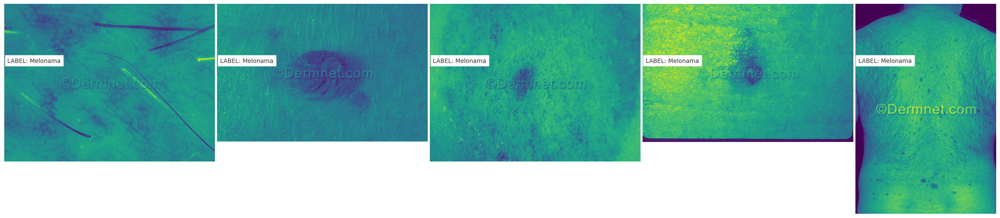

In [36]:
plotGridImages('Melonama',melonama_train_files, melonama_train_path,ncols=5)

Acne


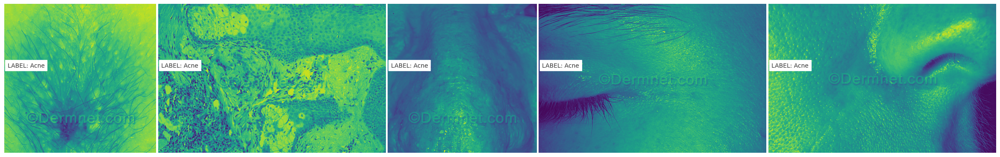

In [37]:
plotGridImages('Acne',acne_train_files, acne_train_path,ncols=5)

Actinic


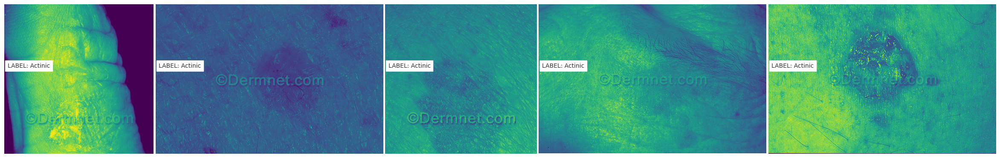

In [38]:
plotGridImages('Actinic',actinic_train_files, actinic_train_path,ncols=5)

Actinic


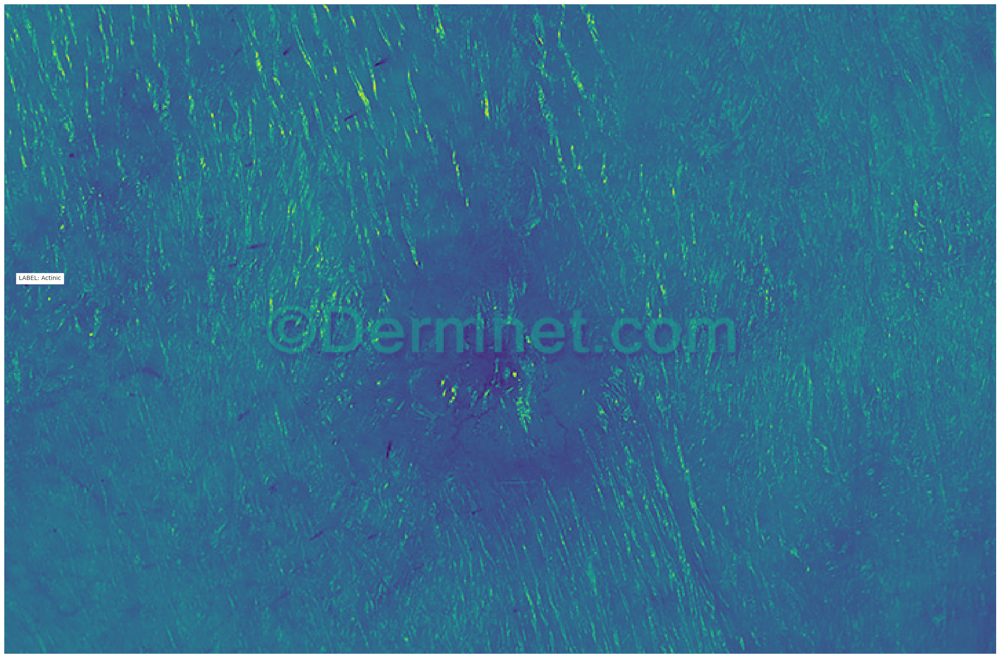

In [39]:
plotGridImages('Actinic',actinic_train_files, actinic_train_path,ncols=1)

In [40]:
final_df = pd.DataFrame()

In [41]:
melonama_df = pd.DataFrame()
melonama_df['Image'] = [melonama_train_path+'/'+img for img in melonama_train_files]
melonama_df['Label'] = "melonama"

In [42]:
melonama_df.shape

(463, 2)

In [43]:
actinic_df = pd.DataFrame()
actinic_df['Image'] =  [actinic_train_path+'/'+img for img in actinic_train_files]
actinic_df['Label'] = "actinic"

In [44]:
actinic_df.shape

(1149, 2)

In [45]:
acne_df = pd.DataFrame()
acne_df['Image'] =  [acne_train_path+'/'+img for img in acne_train_files]
acne_df['Label'] = "acne"

In [46]:
acne_df.shape

(840, 2)

In [47]:
final_df = final_df._append([actinic_df, melonama_df, acne_df])

In [48]:
final_df.shape

(2452, 2)

In [49]:
final_df.sample(10)

,Image,Label
600,D:\train\Acne and Rosacea Photos/perioral-derm...,acne
42,D:\train\Melanoma Skin Cancer Nevi and Moles/a...,melonama
161,D:\train\Actinic Keratosis Basal Cell Carcinom...,actinic
831,D:\train\Actinic Keratosis Basal Cell Carcinom...,actinic
613,D:\train\Acne and Rosacea Photos/perioral-derm...,acne
360,D:\train\Melanoma Skin Cancer Nevi and Moles/m...,melonama
295,D:\train\Melanoma Skin Cancer Nevi and Moles/m...,melonama
248,D:\train\Acne and Rosacea Photos/acne-open-com...,acne
425,D:\train\Actinic Keratosis Basal Cell Carcinom...,actinic
129,D:\train\Acne and Rosacea Photos/acne-cystic-1...,acne


c:\Users\VINAYAGAMOORTHY\Desktop\SIH\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\VINAYAGAMOORTHY\Desktop\SIH\venv\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


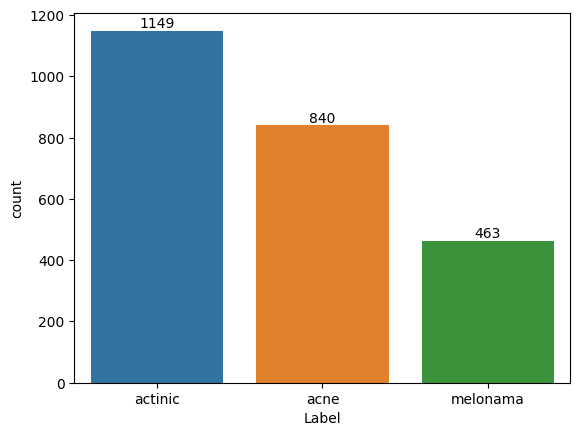

In [50]:
ax = sns.countplot(x=final_df['Label'],
                   order=final_df['Label'].value_counts(ascending=False).index);

abs_values = final_df['Label'].value_counts(ascending=False).values

ax.bar_label(container=ax.containers[0], labels=abs_values);

In [ ]:
# Observation: Imabalnced dataset

In [51]:
final_test_df = pd.DataFrame()
################# melonama #########

melonama_test_df = pd.DataFrame()
melonama_test_df['Image'] = [melonama_test_path+'/'+img for img in melonama_test_files]
melonama_test_df['Label'] = "melonama"

##################  actinic  ##########

actinic_test_df = pd.DataFrame()
actinic_test_df['Image'] =  [actinic_test_path+'/'+img for img in actinic_test_files]
actinic_test_df['Label'] = "actinic"

################  acne  ##########

acne_test_df = pd.DataFrame()
acne_test_df['Image'] =  [acne_test_path+'/'+img for img in acne_test_files]
acne_test_df['Label'] = "acne"
###########################################
###########################################

final_test_df = final_test_df._append([actinic_test_df, 
                                      melonama_test_df, 
                                      acne_test_df])

final_test_df.shape

(716, 2)

In [ ]:
# applying image augmentation techniques

In [52]:
train_data_gen  = ImageDataGenerator(
                                    rescale=1 / 255.0,
                                    rotation_range=40,
                                    width_shift_range=0.2,
                                    height_shift_range=0.2,
                                    horizontal_flip = True,
                                    vertical_flip = True,
                                    validation_split=0.2,
                                    fill_mode='nearest')
test_data_gen = ImageDataGenerator(rescale=1 / 255.0)

In [53]:
batch_size = 8
train_generator = train_data_gen.flow_from_dataframe(
    dataframe=final_df,
    x_col="Image",
    y_col="Label",
    target_size=(256, 256),
    batch_size=batch_size,
    class_mode="categorical",#sparse
    subset='training',
    shuffle=True,
    seed=42
)
valid_generator = train_data_gen.flow_from_dataframe(
    dataframe=final_df,
    x_col="Image",
    y_col="Label",
    target_size=(256, 256),
    batch_size=batch_size,
    class_mode="categorical", #sparse
    subset='validation',
    shuffle=True,
    seed=42 
)
test_generator = test_data_gen.flow_from_dataframe(
    dataframe=final_test_df,
    x_col="Image",
    y_col="Label",
    target_size=(256, 256),
    batch_size=1,
    class_mode='categorical',
    shuffle=False,
)

Found 1962 validated image filenames belonging to 3 classes.
Found 490 validated image filenames belonging to 3 classes.
Found 716 validated image filenames belonging to 3 classes.


In [54]:
# VGG16 with Input shape of our Images
# Include Top is set to false to allow us to add more layers

res = VGG16(weights ='imagenet', include_top = False, 
               input_shape = (256, 256, 3)) 
               
# Setting the trainable to false
res.trainable = False


x= res.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
# x = Dropout(0.5)(x) 
x = Dense(512, activation ='relu')(x)
x = BatchNormalization()(x)
# x = Dropout(0.5)(x)

x = Dense(256, activation ='relu')(x)
x = BatchNormalization()(x)

x = Dense(3, activation ='softmax')(x)
model = Model(res.input, x)

model.compile(optimizer =tf.keras.optimizers.RMSprop(learning_rate=0.0001),  #'Adam'
              loss ="categorical_crossentropy",  #sparse_categorical_crossentropy
              metrics =["categorical_accuracy"])  #sparse_categorical_accuracy

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

In [55]:
from tensorflow.keras.utils import plot_model

In [57]:
from keras.callbacks import EarlyStopping

In [58]:
custom_early_stopping = EarlyStopping(
    monitor='val_loss', 
    patience=10, 
    min_delta=0.001, 
    mode='min'
)

In [80]:
history = model.fit(train_generator, 
                    epochs=30, 
                    validation_data=valid_generator,
                   callbacks=[custom_early_stopping])

Epoch 1/30
246/246 [==============================] - 570s 2s/step - loss: 0.9115 - categorical_accuracy: 0.6040 - val_loss: 1.0189 - val_categorical_accuracy: 0.5653
Epoch 2/30
246/246 [==============================] - 563s 2s/step - loss: 0.8725 - categorical_accuracy: 0.5979 - val_loss: 0.8601 - val_categorical_accuracy: 0.6306
Epoch 3/30
246/246 [==============================] - 547s 2s/step - loss: 0.8734 - categorical_accuracy: 0.6218 - val_loss: 1.0146 - val_categorical_accuracy: 0.5633
Epoch 4/30
246/246 [==============================] - 546s 2s/step - loss: 0.8398 - categorical_accuracy: 0.6335 - val_loss: 0.9874 - val_categorical_accuracy: 0.5571
Epoch 5/30
246/246 [==============================] - 540s 2s/step - loss: 0.7957 - categorical_accuracy: 0.6549 - val_loss: 0.8602 - val_categorical_accuracy: 0.6224
Epoch 6/30
246/246 [==============================] - 542s 2s/step - loss: 0.8066 - categorical_accuracy: 0.6555 - val_loss: 0.9873 - val_categorical_accuracy: 0.581

Accuracy plot

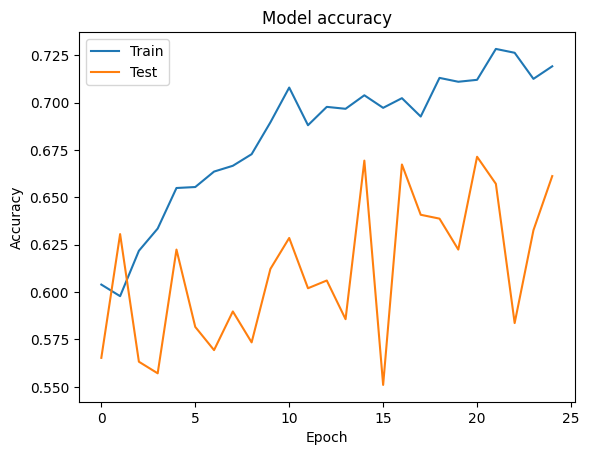

In [81]:
#plot accuracy vs epoch
plt.plot(history.history['categorical_accuracy']) #sparse_categorical_accuracy
plt.plot(history.history['val_categorical_accuracy']) #val_sparse_categorical_accuracy
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

Loss plot

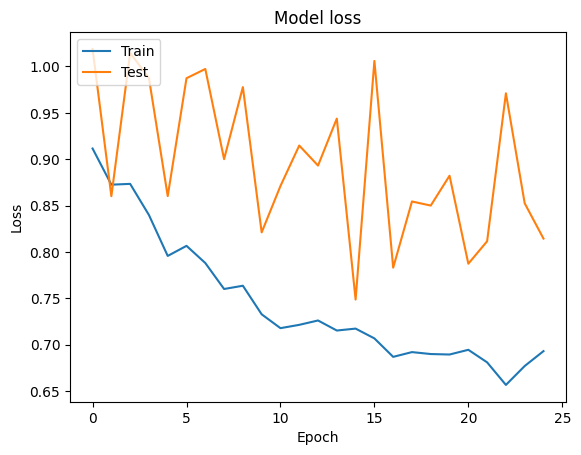

In [82]:
# Plot loss values vs epoch
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

716/716 [==============================] - 196s 274ms/step


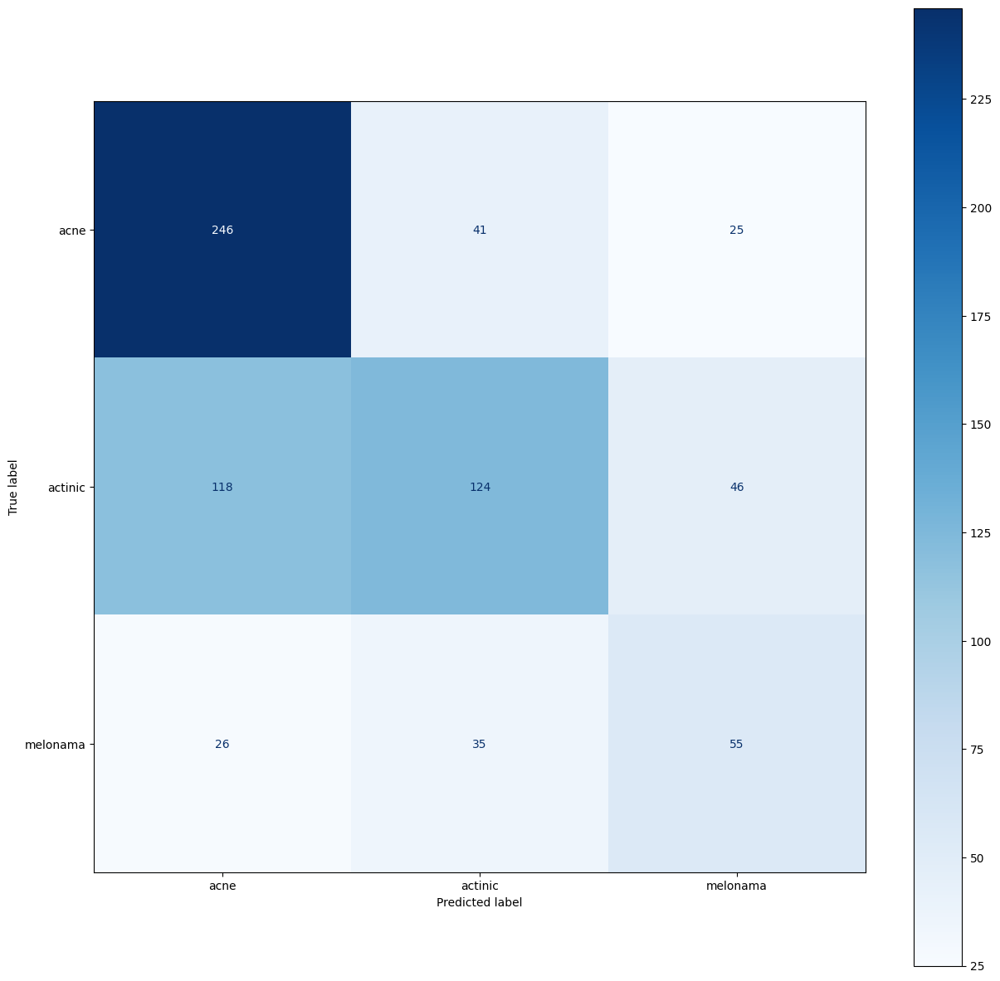

In [65]:
test_true=test_generator.classes
test_pred_raw = model.predict(test_generator)
test_pred = np.argmax(test_pred_raw, axis=1)

cm = confusion_matrix(test_true, test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['acne','actinic','melonama'])
fig, ax = plt.subplots(figsize=(15,15))
disp.plot(ax=ax,cmap=plt.cm.Blues)
plt.show()

In [83]:
result = model.evaluate(test_generator,batch_size=32)
print("test_loss, test accuracy",result)

716/716 [==============================] - 154s 214ms/step - loss: 0.7769 - categorical_accuracy: 0.6927
test_loss, test accuracy [0.7769303321838379, 0.6927374005317688]


In [84]:
vgg_preds = model.predict(test_generator)
vgg_pred_classes = np.argmax(vgg_preds, axis=1)

716/716 [==============================] - 154s 215ms/step


In [85]:
true_classes = test_generator.classes
class_indices = train_generator.class_indices
class_indices = dict((v,k) for k,v in class_indices.items())


vgg_acc = accuracy_score(true_classes, vgg_pred_classes)
print("VGG16 Model Accuracy: {:.2f}%".format(vgg_acc * 100))

VGG16 Model Accuracy: 69.27%


In [ ]:
# Test dataset accuracy is 69.6%

In [92]:
img = tf.keras.utils.load_img(
    'D:\\test\Melanoma Skin Cancer Nevi and Moles\\congenital-nevus-19.jpg',
    target_size=(256, 256)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

1/1 [==============================] - 0s 258ms/step


In [93]:
score = tf.nn.softmax(predictions[0])

class_names = list(train_generator.class_indices)

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

This image most likely belongs to melonama with a 57.61 percent confidence.


In [103]:
from keras.preprocessing import image
def predict_image_class(image_path,true_value):

    img = cv2.imread(image_path)
    img = cv2.resize(img,(256,256))

    img = np.expand_dims(img, axis=0)

    img_class = model.predict(img, batch_size=1)
    
    score = tf.nn.softmax(img_class[0])

    class_names = list(train_generator.class_indices)

    print(
        "This image most likely belongs to {}"
        .format(class_names[np.argmax(score)])
    )
    
    
    # for folder_name in our_folders:
    fig = plt.figure(1, figsize=(15, 15))
    grid = ImageGrid(fig, 111, nrows_ncols=(1, 1), axes_pad=0.05)
    ax = grid[0]
    img = image.load_img(image_path, (256, 256))
    img = image.img_to_array(img)
    ax.imshow(img / 255.)
    
    ax.text(10, 150, 'True Label: %s' % true_value.upper(), color='g', backgroundcolor='w',\
    alpha=0.8, size = 20)
    
    ax.text(10, 200, 'Predicted Label: %s' % class_names[np.argmax(score)].upper(), color='k', backgroundcolor='w',\
    alpha=0.8, size = 20)
    ax.axis('off')
    plt.show()

1/1 [==============================] - 1s 543ms/step
This image most likely belongs to melonama


c:\Users\VINAYAGAMOORTHY\Desktop\SIH\venv\lib\site-packages\keras\src\utils\image_utils.py:409: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn(


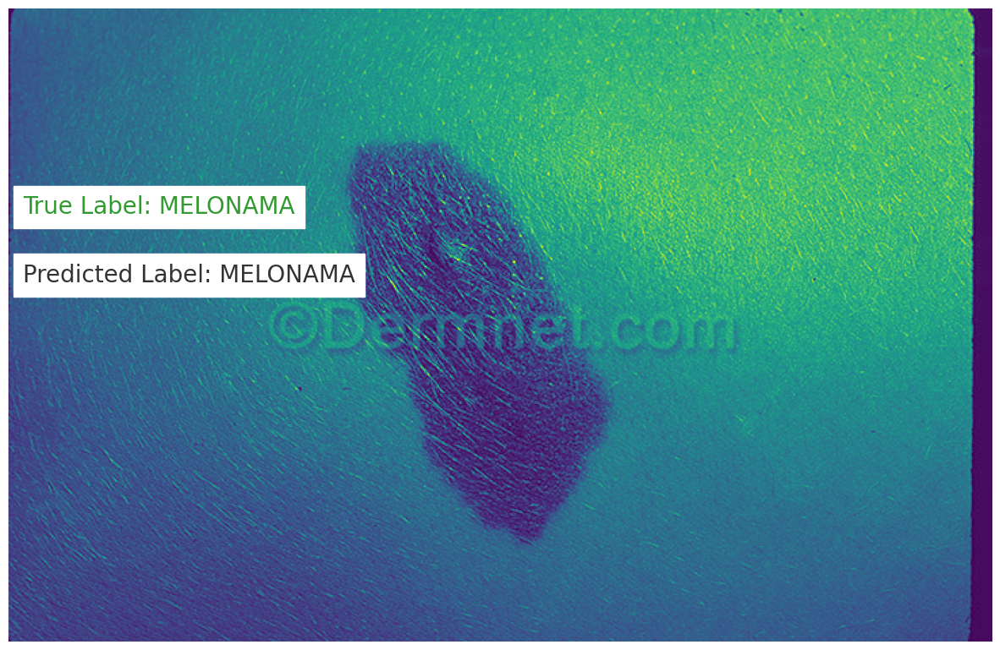

In [104]:
predict_image_class('D:\\test\Melanoma Skin Cancer Nevi and Moles\\congenital-nevus-19.jpg','melonama')

1/1 [==============================] - 0s 488ms/step
This image most likely belongs to acne


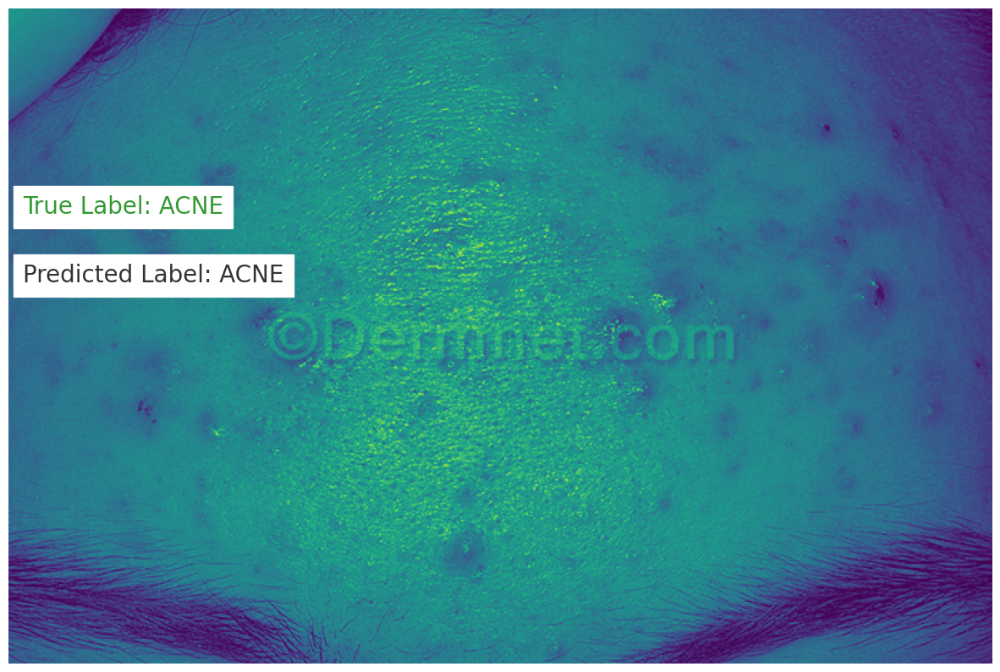

In [106]:
predict_image_class('D:\\test\\Acne and Rosacea Photos\\acne-cystic-33.jpg','Acne')

In [ ]:
import pickle

# Saving model to disk
pickle.dump(model, open('model.pkl','wb'))